git clone https://github.com/ultralytics/yolov5

cd yolov5

pip install -r requirements.txt

In [1]:
import os
import pandas as pd
import cv2
import matplotlib.pyplot as plt
import random
import shutil
import subprocess
from tqdm import tqdm
from collections import defaultdict

from sklearn.metrics import confusion_matrix, classification_report

from sklearn.preprocessing import LabelEncoder 

In [2]:
current_dir = os.getcwd()
parent_dir = os.path.abspath(os.path.join(os.getcwd(), os.pardir, os.pardir))
working_path = os.path.join(parent_dir) #incase directory needs to be expanded
downloads_path = os.path.expanduser("~\\Downloads")
extract_dir = os.path.expanduser("~\\Data_science")

In [3]:
image_dest_path = os.path.join(working_path, 'data', 'Images')
image_dataset_path = image_dest_path

csv_path = os.path.join(working_path, 'data', 'csv')

In [4]:
csv_bounding_boxes = (f'{csv_path}\\PCB_annotations_dataset.csv')
images = os.listdir(image_dataset_path)

In [5]:
bounding_boxes_data = pd.read_csv(csv_bounding_boxes, sep=";")

In [6]:
# Function to convert bounding box coordinates to YOLO format
def convert_bbox_to_yolo(size, box):
    dw = 1. / size[0]
    dh = 1. / size[1]
    x = ((box[0] + box[1]) / 2.0 - 1) * dw
    y = ((box[2] + box[3]) / 2.0 - 1) * dh
    w = (box[1] - box[0]) * dw
    h = (box[3] - box[2]) * dh
    return (x, y, w, h)


In [7]:
yolo_labels_path = os.path.join(working_path, 'data', 'yolo_labels')
os.makedirs(yolo_labels_path, exist_ok=True)

In [8]:
unique_class_ids = bounding_boxes_data['defect'].unique()

In [9]:
encoder = LabelEncoder()

In [10]:
# Fit the encoder on unique class IDs
encoder.fit(unique_class_ids)

LabelEncoder()

In [11]:
for filename, group in bounding_boxes_data.groupby('filename'):
    image_path = os.path.join(image_dataset_path, f"{filename}.jpg")
    image = cv2.imread(image_path)
    
    if image is not None:
        h, w, _ = image.shape
        size = (w, h)
        
        label_file_path = os.path.join(yolo_labels_path, f"{os.path.splitext(filename)[0]}.txt")
        
        with open(label_file_path, 'w') as label_file:
            # Label encode class IDs
            encoded_class_ids = encoder.transform(group['defect'])
            
            for class_id, (_, row) in zip(encoded_class_ids, group.iterrows()):
                bbox = (row['xmin'], row['xmax'], row['ymin'], row['ymax'])
                yolo_bbox = convert_bbox_to_yolo(size, bbox)
                label_file.write(f"{class_id} {' '.join(map(str, yolo_bbox))}\n")
    else:
        print(f"Image {filename} not found.")

print("YOLO annotations have been successfully created.")

Image l_light_01_mouse_bite_02_1_600 not found.
Image l_light_01_mouse_bite_04_1_600 not found.
Image l_light_01_mouse_bite_08_1_600 not found.
Image l_light_01_mouse_bite_17_3_600 not found.
Image l_light_01_open_circuit_03_1_600 not found.
Image l_light_01_spur_05_1_600 not found.
Image l_light_01_spurious_copper_01_2_600 not found.
Image l_light_04_missing_hole_14_1_600 not found.
Image l_light_04_missing_hole_14_2_600 not found.
Image l_light_04_missing_hole_20_1_600 not found.
Image l_light_04_mouse_bite_03_1_600 not found.
Image l_light_04_open_circuit_04_1_600 not found.
Image l_light_04_open_circuit_05_2_600 not found.
Image l_light_04_open_circuit_13_2_600 not found.
Image l_light_04_open_circuit_14_4_600 not found.
Image l_light_04_open_circuit_16_1_600 not found.
Image l_light_04_short_02_3_600 not found.
Image l_light_04_short_04_1_600 not found.
Image l_light_04_short_15_1_600 not found.
Image l_light_04_spur_01_1_600 not found.
Image l_light_04_spur_09_2_600 not found.
Im

In [12]:
yolo_image_train_path = os.path.join(working_path, 'data', 'yolo_data', 'images', 'train')
yolo_image_val_path = os.path.join(working_path, 'data', 'yolo_data', 'images', 'val')
yolo_label_train_path = os.path.join(working_path, 'data', 'yolo_data', 'labels', 'train')
yolo_label_val_path = os.path.join(working_path, 'data', 'yolo_data', 'labels', 'val')

os.makedirs(yolo_image_train_path, exist_ok=True)
os.makedirs(yolo_image_val_path, exist_ok=True)
os.makedirs(yolo_label_train_path, exist_ok=True)
os.makedirs(yolo_label_val_path, exist_ok=True)

In [13]:
image_files = [f for f in os.listdir(image_dataset_path) if f.endswith('.jpg')]

In [14]:
random.shuffle(image_files)

defect_names = ["missing_hole_", "spur_", "spurious_copper_", "short_", "open_circuit_", "mouse_bite_"]

# Extract defect class from the filename
def get_defect_class(filename):
    for defect in defect_names:
        if defect in filename:
            return defect
    return "unknown"

grouped_images = defaultdict(list)
for image_file in image_files:
    defect_class = get_defect_class(image_file)
    grouped_images[defect_class].append(image_file)

train_files = []
val_files = []
train_counts = defaultdict(int)
val_counts = defaultdict(int)

for defect_class, images in grouped_images.items():
    train_size = int(0.7 * len(images))
    train_files.extend(images[:train_size])
    val_files.extend(images[train_size:])

    # Count the number of images in training and validation sets for each defect class
    train_counts[defect_class] += len(images[:train_size])
    val_counts[defect_class] += len(images[train_size:])


for defect_class, count in train_counts.items():
    print(f"{defect_class}: {count} files")


mouse_bite_: 699 files
short_: 699 files
open_circuit_: 699 files
spurious_copper_: 700 files
spur_: 699 files
missing_hole_: 699 files


In [15]:
def delete_all_files(directory):
    if os.path.exists(directory):
        for filename in os.listdir(directory):
            file_path = os.path.join(directory, filename)
            try:
                if os.path.isfile(file_path) or os.path.islink(file_path):
                    os.unlink(file_path)
                elif os.path.isdir(file_path):
                    shutil.rmtree(file_path)
            except Exception as e:
                print(f'Failed to delete {file_path}. Reason: {e}')

In [16]:
delete_all_files(yolo_image_train_path)
delete_all_files(yolo_image_val_path)
delete_all_files(yolo_label_train_path)
delete_all_files(yolo_label_val_path)

In [17]:
def copy_files(file_list, src_image_path, src_label_path, dst_image_path, dst_label_path):
    for filename in file_list:
        src_image = os.path.join(src_image_path, filename)
        dst_image = os.path.join(dst_image_path, filename)
        shutil.copyfile(src_image, dst_image)
        
        label_filename = filename.replace('.jpg', '.txt')
        src_label = os.path.join(src_label_path, label_filename)
        dst_label = os.path.join(dst_label_path, label_filename)

        if os.path.exists(src_label):
            shutil.copyfile(src_label, dst_label)

copy_files(train_files, image_dataset_path, yolo_labels_path, yolo_image_train_path, yolo_label_train_path)
copy_files(val_files, image_dataset_path, yolo_labels_path, yolo_image_val_path, yolo_label_val_path)

print(f"Copied {len(train_files)} training files and {len(val_files)} validation files.")

Copied 4195 training files and 1800 validation files.


In [18]:
# verify the copied files
train_images_copied = os.listdir(yolo_image_train_path)
val_images_copied = os.listdir(yolo_image_val_path)
train_labels_copied = os.listdir(yolo_label_train_path)
val_labels_copied = os.listdir(yolo_label_val_path)

print(f"Training images copied: {len(train_images_copied)}")
print(f"Validation images copied: {len(val_images_copied)}")
print(f"Training labels copied: {len(train_labels_copied)}")
print(f"Validation labels copied: {len(val_labels_copied)}")

Training images copied: 4195
Validation images copied: 1800
Training labels copied: 4195
Validation labels copied: 1800


In [19]:
yolo_image_path = os.path.join(working_path, 'data', 'yolo_data', 'images')

In [20]:
def pad_images(image_folder, target_size=(640, 640)):
    for image_name in tqdm(os.listdir(image_folder)):
        image_path = os.path.join(image_folder, image_name)
        image = cv2.imread(image_path)
        h, w = image.shape[:2]
        pad_height = target_size[0] - h
        pad_width = target_size[1] - w
        top_pad = pad_height // 2
        bottom_pad = pad_height - top_pad
        left_pad = pad_width // 2
        right_pad = pad_width - left_pad
        padded_image = cv2.copyMakeBorder(image, top_pad, bottom_pad, left_pad, right_pad, cv2.BORDER_CONSTANT, value=(0, 0, 0))
        cv2.imwrite(image_path, padded_image)

In [21]:
def reverse_convert_bbox_to_yolo(box, original_size = (600, 600)):
    dw = 1. / original_size[0]
    dh = 1. / original_size[1]

    x_center = box[0] / dw + 1
    y_center = box[1] / dh + 1
    width = box[2] / dw
    height = box[3] / dh

    x_min = int(x_center - width / 2)
    x_max = int(x_center + width / 2)
    y_min = int(y_center - height / 2)
    y_max = int(y_center + height / 2)
    return (x_min, x_max, y_min, y_max)


In [22]:
def update_label_files(label_folder, original_size=(600,600), target_size=(640, 640)):
    for label_name in tqdm(os.listdir(label_folder)):
        label_path = os.path.join(label_folder, label_name)
        with open(label_path, 'r') as file:
            lines = file.readlines()
        updated_lines = []
        for line in lines:
            parts = line.strip().split()
            class_id = parts[0]
            x_center_norm = float(parts[1])
            y_center_norm = float(parts[2])
            width_norm = float(parts[3])
            height_norm = float(parts[4])
            box = x_center_norm, y_center_norm, width_norm, height_norm
            new_box = reverse_convert_bbox_to_yolo(box)
            
            x_min, x_max, y_min, y_max = new_box
            pad_width = target_size[1] - original_size[1]
            pad_height = target_size[0] - original_size[0]
            x_min += (pad_width) // 2
            x_max += (pad_width) // 2
            y_min += (pad_height) // 2
            y_max += (pad_height) // 2
            
            yolo_bbox = convert_bbox_to_yolo(target_size, (x_min, x_max, y_min, y_max))

            #print(f"Original values: class_id={class_id}, x_center_norm={x_center_norm}, y_center_norm={y_center_norm}, width_norm={width_norm}, height_norm={height_norm}")
            #print(f"Converted values: x_min={x_min}, x_max={x_max}, y_min={y_min}, y_max={y_max}")
            #print(f"YOLO BBox: {yolo_bbox}")
            
            #yolo_bbox = convert_bbox_to_yolo((640,640), new_box)
            # Convert normalized coordinates to pixel coordinates
            x_center = float(yolo_bbox[0])
            y_center = float(yolo_bbox[1])
            width = float(yolo_bbox[2])
            height = float(yolo_bbox[3])
            updated_line = f"{class_id} {x_center} {y_center} {width} {height}\n"
            updated_lines.append(updated_line)
        # Write updated lines back to the label file
        with open(label_path, 'w') as f:
            f.writelines(updated_lines)

In [23]:
# Pad images
pad_images(yolo_image_train_path)
pad_images(yolo_image_val_path)

  0%|          | 0/4195 [00:00<?, ?it/s]

100%|██████████| 1800/1800 [00:29<00:00, 61.35it/s]


In [24]:
# Update label files
update_label_files(yolo_label_train_path)
update_label_files(yolo_label_val_path)

  0%|          | 0/4195 [00:00<?, ?it/s]

100%|██████████| 1800/1800 [00:13<00:00, 136.29it/s]


In [25]:
# read YOLO format label files
def read_label_file(label_path):
    with open(label_path, 'r') as file:
        lines = file.readlines()
    
    boxes = []
    for line in lines:
        class_id, x_center, y_center, width, height = line.split()
        x_center, y_center, width, height = map(float, (x_center, y_center, width, height))
        boxes.append((class_id, x_center, y_center, width, height))
    return boxes

In [26]:
# draw bounding boxes on images
def draw_boxes(image, boxes):
    h, w, _ = image.shape
    for box in boxes:
        class_id, x_center, y_center, width, height = box
        x_min = int((x_center - width / 2) * w)
        y_min = int((y_center - height / 2) * h)
        x_max = int((x_center + width / 2) * w)
        y_max = int((y_center + height / 2) * h)
        cv2.rectangle(image, (x_min, y_min), (x_max, y_max), (0, 255, 0), 2)
    return image

In [27]:
# debugging to see if bbox line up with defects
image_files = os.listdir(yolo_image_val_path)
sample_images = image_files[:2]
#print(sample_images)
for image_name in sample_images:
    image_path = os.path.join(yolo_image_val_path, image_name)
    image = cv2.imread(image_path)

    label_name = os.path.splitext(image_name)[0] + '.txt'
    label_path = os.path.join(yolo_label_val_path, label_name)
    boxes = read_label_file(label_path)

    image_with_boxes = draw_boxes(image.copy(), boxes)

    cv2.imshow('Image with Bounding Boxes', image_with_boxes)
    cv2.waitKey(0)

cv2.destroyAllWindows()

In [994]:
# Training the YOLOv5 model
command1 = [
    'python', 
    'C:/Users/wfaiz/yolov5/train.py',
    '--img', '640',
    '--batch', '16',
    '--epochs', '50',
    '--data', 'C:/Users/wfaiz/yolov5/dataset.yaml',
    '--weights', 'yolov5s.pt',
    '--cache'
]

result1 = subprocess.run(command1, capture_output=True, text=True)

print(result1.stdout)
print(result1.stderr)

In [922]:
# Validation of the dataset with the trained model
command2 = [
    'python', 
    'C:/Users/wfaiz/yolov5/val.py', 
    '--weights', 'C:/Users/wfaiz/yolov5/runs/train/exp2/weights/best.pt', 
    '--data', 'C:/Users/wfaiz/yolov5/dataset.yaml', 
    '--img', '640'
]

result2 = subprocess.run(command2, capture_output=True, text=True)

print(result2.stdout)
print(result2.stderr)

=======================Classification Report=======================
                 precision    recall  f1-score  support
missing_hole      0.927273  1.000000  0.962264     51.0
mouse_bite        0.912281  0.753623  0.825397     69.0
open_circuit      0.928571  0.881356  0.904348     59.0
short             0.937500  0.882353  0.909091     68.0
spurious_copper   0.934783  0.843137  0.886598     51.0
spur              0.967742  0.833333  0.895522     72.0
avg / total       0.934692  0.865634  0.897203    370.0
=======================Classification Report=======================

val: data=C:/Users/wfaiz/yolov5/dataset.yaml, weights=['C:/Users/wfaiz/yolov5/runs/train/exp2/weights/best.pt'], batch_size=32, imgsz=640, conf_thres=0.001, iou_thres=0.6, max_det=300, task=val, device=, workers=8, single_cls=False, augment=False, verbose=False, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=..\..\..\..\..\..\yolov5\runs\val, name=exp, exist_ok=False, half=False, dn

In [831]:
# Predicting the results from test/validation dataset
command3 = [
    'python',
    'C:/Users/wfaiz/yolov5/detect.py',
    '--weights', 'C:/Users/wfaiz/yolov5/runs/train/exp2/weights/best.pt',
    '--img', '640',
    '--source', 'C:/Users/wfaiz/OneDrive/Documents/GitHub/PCB_Defects_Detection/data/yolo_data/images/val'
]

result3 = subprocess.run(command3, capture_output=True, text=True)

print(result3.stdout)
print(result3.stderr)


detect: weights=['C:/Users/wfaiz/yolov5/runs/train/exp/weights/best.pt'], source=C:/Users/wfaiz/OneDrive/Documents/GitHub/PCB_Defects_Detection/data/yolo_data/images/val, data=..\..\..\..\..\..\yolov5\data\coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=..\..\..\..\..\..\yolov5\runs\detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5  v7.0-314-g60dde7f1 Python-3.12.3 torch-2.3.0 CPU

Fusing layers... 
Model summary: 157 layers, 7026307 parameters, 0 gradients, 15.8 GFLOPs
image 1/180 C:\Users\wfaiz\OneDrive\Documents\GitHub\PCB_Defects_Detection\data\yolo_data\images\val\l_light_01_missing_hole_14_2_600.jpg: 640x640 2 missing_holes, 99.7ms
image 2/180 C:\Users\wfaiz\OneDrive\Documents\Gi

In [837]:
results_csv_path = 'C:/Users/wfaiz/yolov5/runs/train/exp2/results.csv'

In [838]:
df = pd.read_csv(results_csv_path)
df.head()

,epoch,train/box_loss,train/obj_loss,train/cls_loss,metrics/precision,metrics/recall,metrics/mAP_0.5,metrics/mAP_0.5:0.95,val/box_loss,val/obj_loss,val/cls_loss,x/lr0,x/lr1,x/lr2
0,0,0.127010,0.025047,0.055701,0.000000,0.000000,0.000000,0.000000,0.118580,0.019637,0.054304,0.076600,0.002600,0.002600
1,1,0.114650,0.021732,0.051753,0.000054,0.016340,0.000032,0.000004,0.109250,0.018700,0.049810,0.052195,0.005195,0.005195
2,2,0.109120,0.023400,0.048243,0.000360,0.124460,0.004945,0.000868,0.103450,0.019346,0.044587,0.027683,0.007683,0.007683
3,3,0.103010,0.025018,0.043054,0.674270,0.009804,0.008386,0.002369,0.104150,0.018892,0.040992,0.009406,0.009406,0.009406
4,4,0.099561,0.025293,0.039766,0.907720,0.107840,0.067834,0.023634,0.097036,0.019889,0.040041,0.009406,0.009406,0.009406


In [841]:
df.columns = df.columns.str.strip()
print(df.columns)

Index(['epoch', 'train/box_loss', 'train/obj_loss', 'train/cls_loss',
       'metrics/precision', 'metrics/recall', 'metrics/mAP_0.5',
       'metrics/mAP_0.5:0.95', 'val/box_loss', 'val/obj_loss', 'val/cls_loss',
       'x/lr0', 'x/lr1', 'x/lr2'],
      dtype='object')


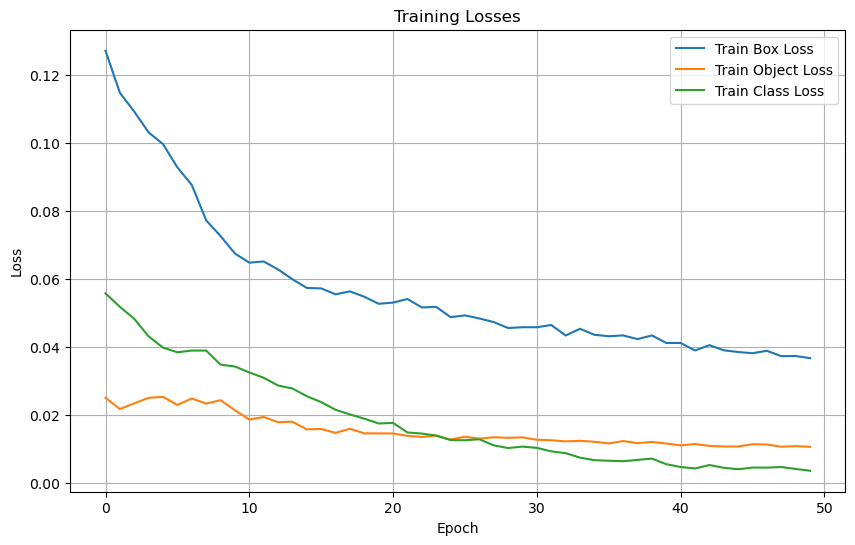

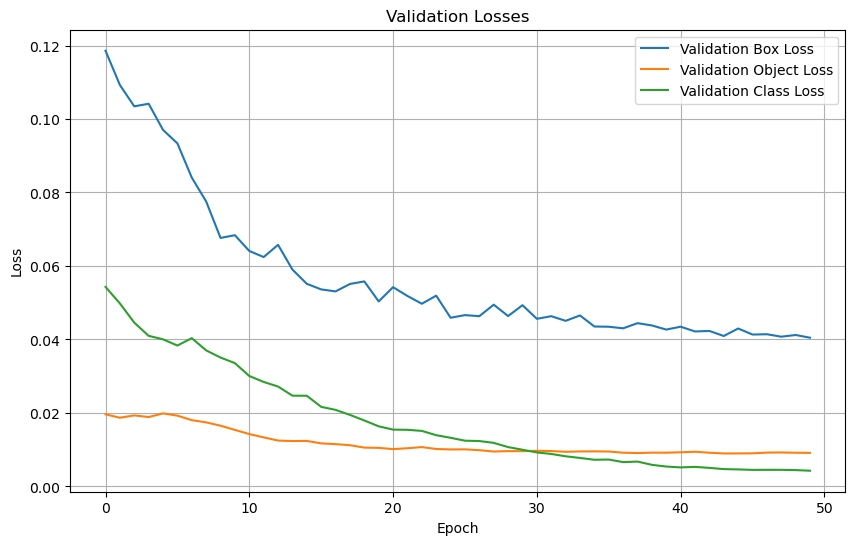

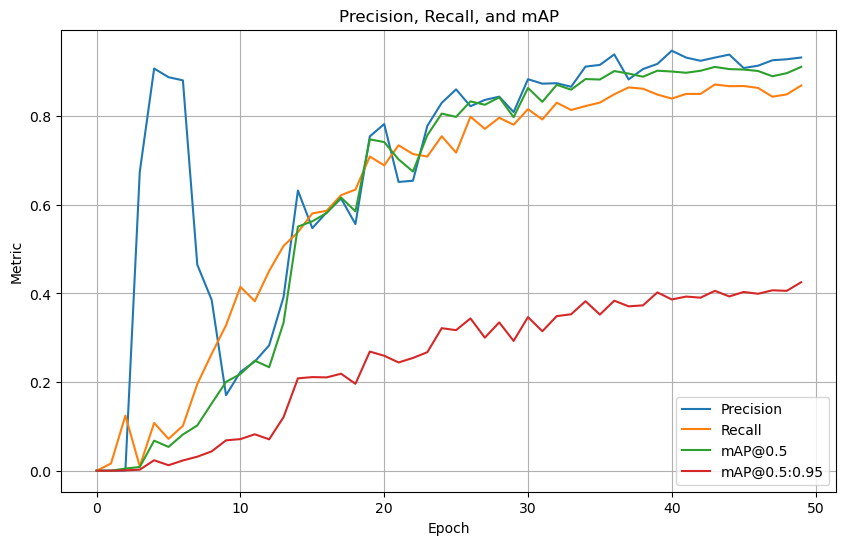

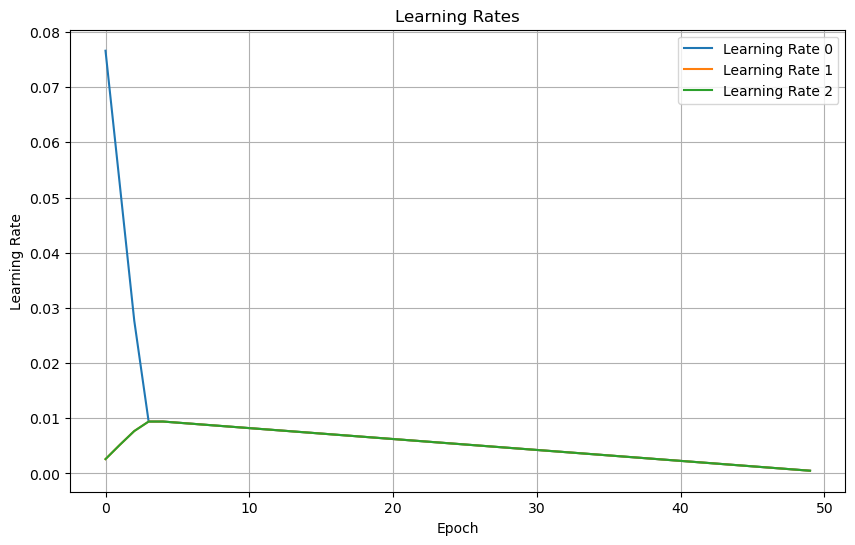

In [842]:
import matplotlib.pyplot as plt

# Plot training losses
plt.figure(figsize=(10, 6))
plt.plot(df['epoch'], df['train/box_loss'], label='Train Box Loss')
plt.plot(df['epoch'], df['train/obj_loss'], label='Train Object Loss')
plt.plot(df['epoch'], df['train/cls_loss'], label='Train Class Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training Losses')
plt.legend()
plt.grid(True)
plt.show()

# Plot validation losses
plt.figure(figsize=(10, 6))
plt.plot(df['epoch'], df['val/box_loss'], label='Validation Box Loss')
plt.plot(df['epoch'], df['val/obj_loss'], label='Validation Object Loss')
plt.plot(df['epoch'], df['val/cls_loss'], label='Validation Class Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Validation Losses')
plt.legend()
plt.grid(True)
plt.show()

# Plot precision, recall, and mAP
plt.figure(figsize=(10, 6))
plt.plot(df['epoch'], df['metrics/precision'], label='Precision')
plt.plot(df['epoch'], df['metrics/recall'], label='Recall')
plt.plot(df['epoch'], df['metrics/mAP_0.5'], label='mAP@0.5')
plt.plot(df['epoch'], df['metrics/mAP_0.5:0.95'], label='mAP@0.5:0.95')
plt.xlabel('Epoch')
plt.ylabel('Metric')
plt.title('Precision, Recall, and mAP')
plt.legend()
plt.grid(True)
plt.show()

# Plot learning rates
plt.figure(figsize=(10, 6))
plt.plot(df['epoch'], df['x/lr0'], label='Learning Rate 0')
plt.plot(df['epoch'], df['x/lr1'], label='Learning Rate 1')
plt.plot(df['epoch'], df['x/lr2'], label='Learning Rate 2')
plt.xlabel('Epoch')
plt.ylabel('Learning Rate')
plt.title('Learning Rates')
plt.legend()
plt.grid(True)
plt.show()

In [833]:
image_results_path = 'C:/Users/wfaiz/yolov5/runs/detect/exp/'

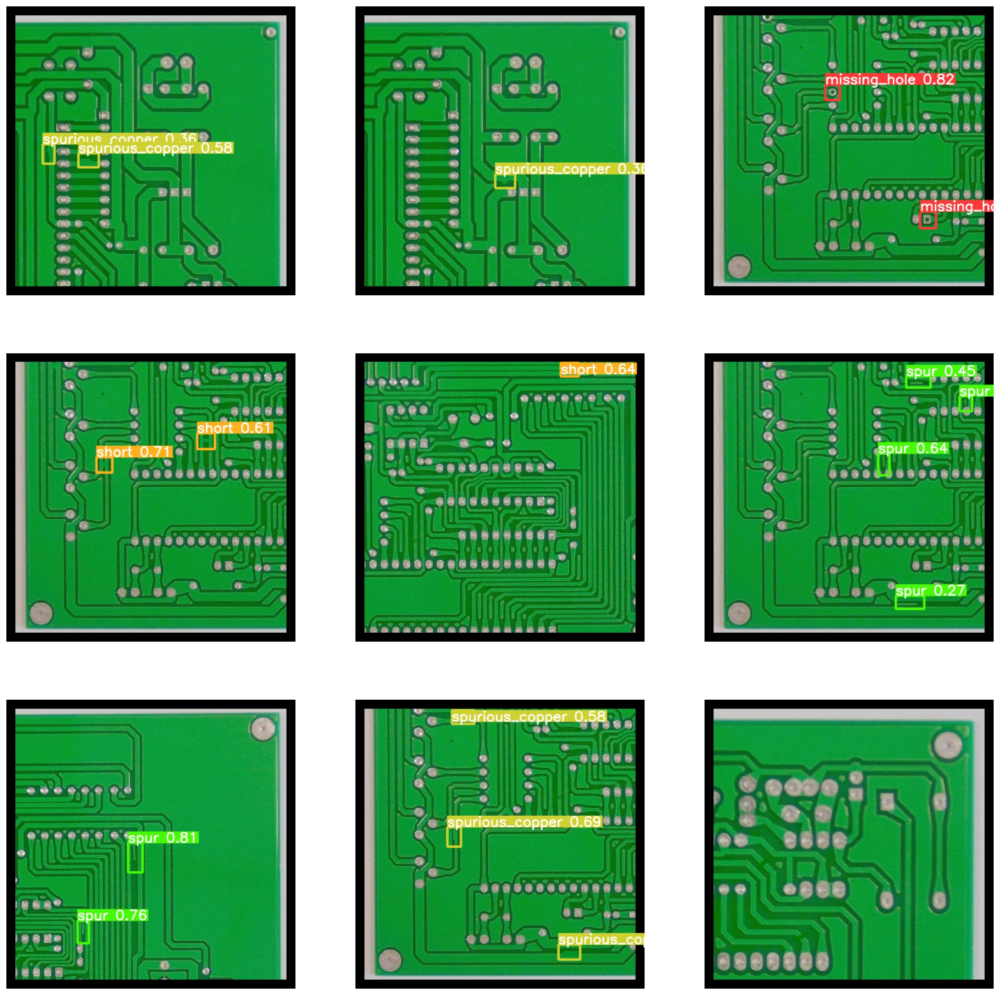

In [695]:
# display the prediction result images
def display_images(image_paths, cols=3, figsize=(20, 20)):
    rows = (len(image_paths) + cols - 1) // cols
    fig, axes = plt.subplots(rows, cols, figsize=figsize)
    for ax, img_path in zip(axes.flat, image_paths):
        img = cv2.imread(img_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        ax.imshow(img)
        ax.axis('off')
    plt.show()

result_images = [os.path.join(image_results_path, f) for f in os.listdir(image_results_path) if f.endswith('.jpg')]
result_images = result_images[9:18]  

display_images(result_images)

In [696]:
def parse_yolo_label(file_path):
    with open(file_path, 'r') as file:
        labels = [line.strip().split() for line in file.readlines()]
    return [(int(label[0]), float(label[1]), float(label[2]), float(label[3]), float(label[4])) for label in labels]


In [697]:
# convert YOLO bbox to (xmin, ymin, xmax, ymax)
def yolo_to_bbox(size, bbox):
    w, h = size
    x_center, y_center, width, height = bbox
    xmin = int((x_center - width / 2) * w)
    ymin = int((y_center - height / 2) * h)
    xmax = int((x_center + width / 2) * w)
    ymax = int((y_center + height / 2) * h)
    return [xmin, ymin, xmax, ymax]

In [707]:
labels = {
    0: 'missing_hole',
    1: 'mouse_bite',
    2: 'open_circuit',
    3: 'short',
    4: 'spur',
    5: 'spurious_copper'
}
def get_class_name(class_id):
    return labels.get(class_id, 'Unknown')

In [736]:
# draw bounding boxes on the image
def draw_bboxes_with_class(image, bboxes, class_ids, color=(0, 255, 0), thickness=2, font=cv2.FONT_HERSHEY_SIMPLEX, font_scale=1):
    for bbox, class_id in zip(bboxes, class_ids):
        xmin, ymin, xmax, ymax = bbox
        class_name = get_class_name(class_id)
        cv2.rectangle(image, (xmin, ymin), (xmax, ymax), color, thickness)

        text_size = cv2.getTextSize(class_name, font, font_scale, thickness)[0]
        text_bg_size = (text_size[0] + 10, text_size[1] + 10)
        cv2.rectangle(image, (xmin, ymax), (xmin + text_bg_size[0], ymax + text_bg_size[1]), color, -1)
        cv2.putText(image, class_name, (xmin + 5, ymax + text_size[1] + 5), font, font_scale, (255, 255, 255), thickness)

    return image

In [699]:
# display original and result images side by side
def display_images_side_by_side(images, titles=None, figsize=(20, 20)):
    fig, axes = plt.subplots(1, len(images), figsize=figsize)
    for ax, img, title in zip(axes, images, titles):
        ax.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        if titles:
            ax.set_title(title)
        ax.axis('off')
    plt.show()

In [700]:

val_image_files = [f for f in os.listdir(yolo_image_val_path) if f.endswith('.jpg')]

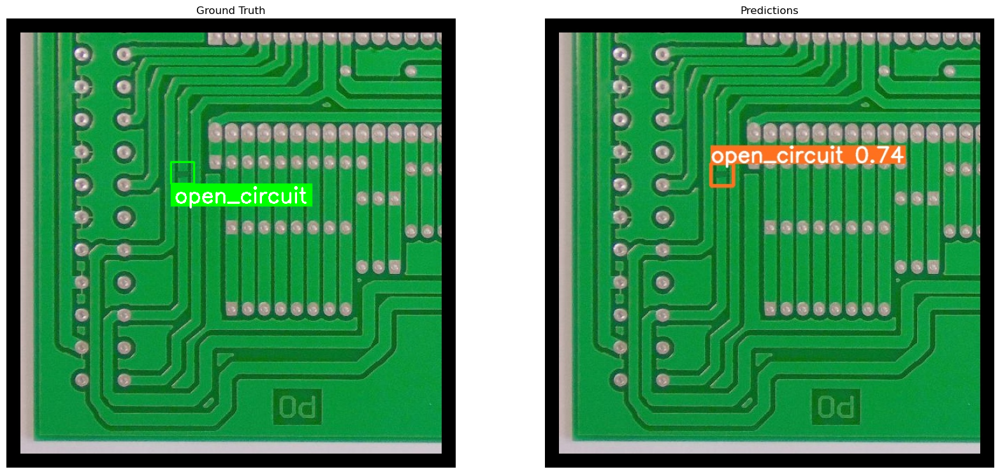

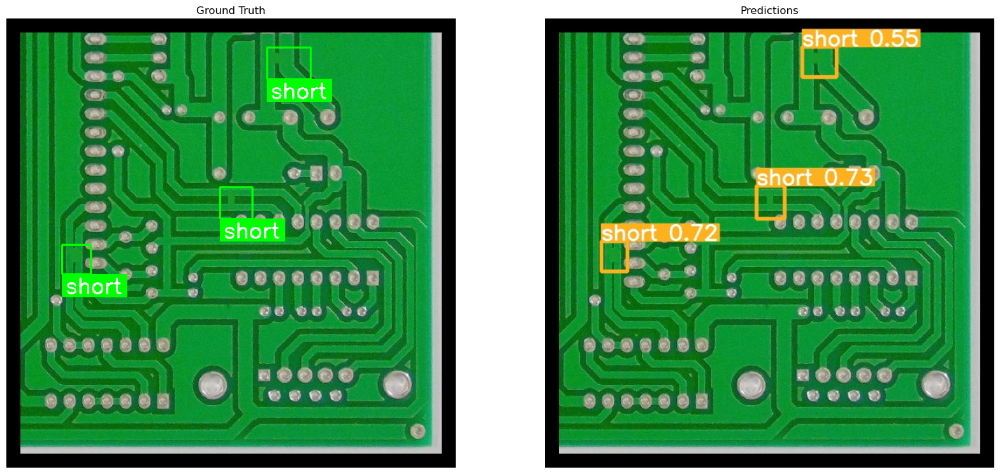

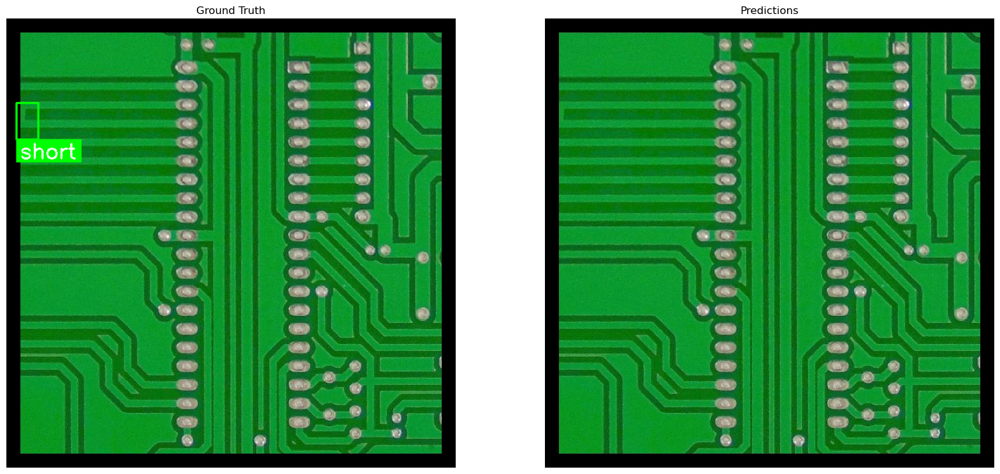

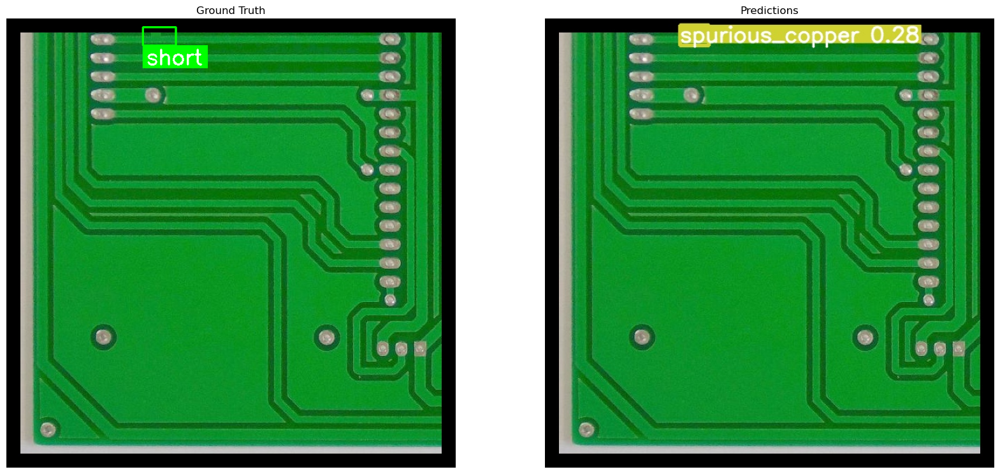

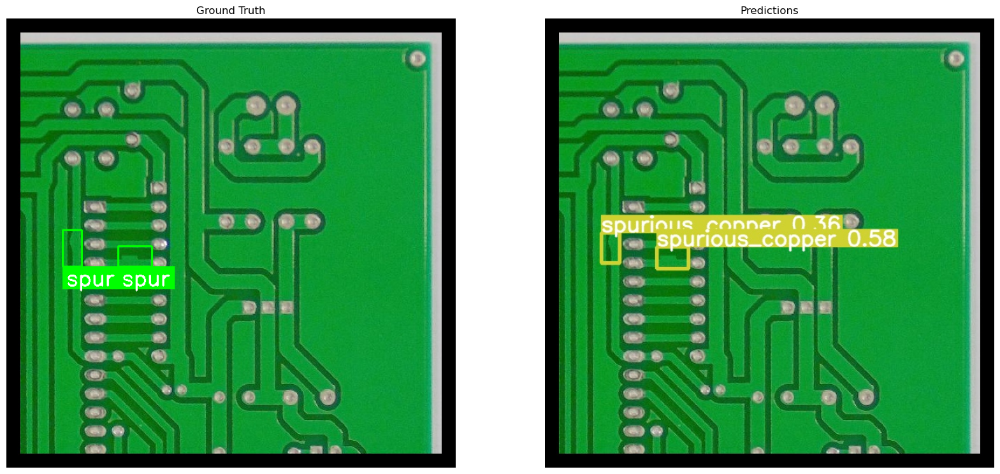

In [737]:
# Display images with ground truth and predictions
for image_file in val_image_files[5:10]:

    image_path = os.path.join(yolo_image_val_path, image_file)
    image = cv2.imread(image_path)
    h, w, _ = image.shape
    size = (w, h)

    label_file = os.path.splitext(image_file)[0] + '.txt'
    ground_truth_path = os.path.join(yolo_label_val_path, label_file)

    ground_truths = parse_yolo_label(ground_truth_path)
    gt_bboxes = [yolo_to_bbox(size, bbox[1:]) for bbox in ground_truths]
    gt_class_ids = [bbox[0] for bbox in ground_truths]

    image_gt = image.copy()
    draw_bboxes_with_class(image_gt, gt_bboxes, gt_class_ids, color=(0, 255, 0))

    prediction_image_path = os.path.join(image_results_path, image_file)
    if not os.path.exists(prediction_image_path):
        print(f"Prediction image not found for {image_file}")
        continue

    image_pred = cv2.imread(prediction_image_path)

    display_images_side_by_side([image_gt, image_pred], titles=['Ground Truth', 'Predictions'])

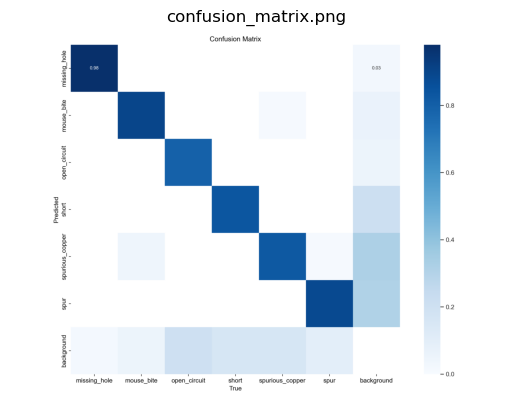

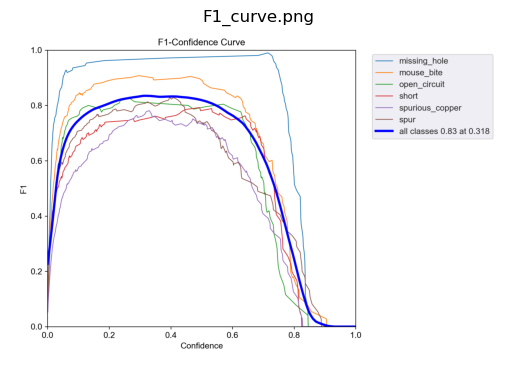

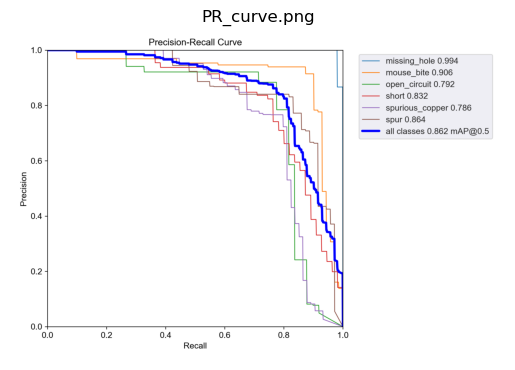

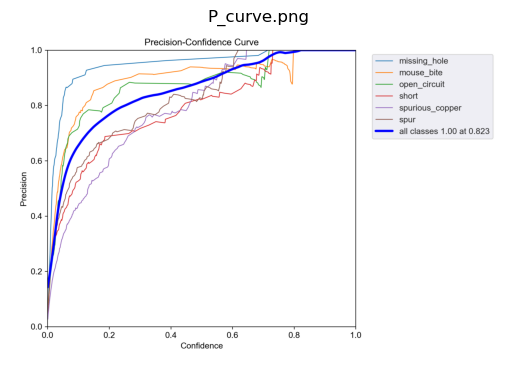

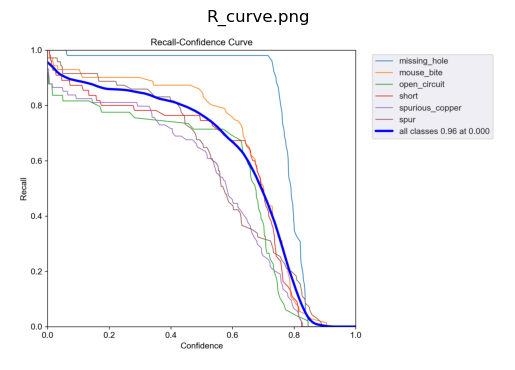

In [742]:
validation_results = 'C:/Users/wfaiz/yolov5/runs/val/exp/'

# Get a list of all files in the directory
files = os.listdir(validation_results)

# Filter only the image files (assuming they have a .jpg extension)
result_image_files = [file for file in files if file.endswith('.png')]

# Display each image
for image_file in result_image_files:
    image_path = os.path.join(validation_results, image_file)
    image = plt.imread(image_path)
    plt.imshow(image)
    plt.title(image_file)
    plt.axis('off')
    plt.show()

In [866]:
import torch
model = torch.hub.load('ultralytics/yolov5', 'custom', path='C:/Users/wfaiz/yolov5/runs/train/exp2/weights/best.pt')
model.eval()

AutoShape(
  (model): DetectMultiBackend(
    (model): DetectionModel(
      (model): Sequential(
        (0): Conv(
          (conv): Conv2d(3, 32, kernel_size=(6, 6), stride=(2, 2), padding=(2, 2))
          (act): SiLU(inplace=True)
        )
        (1): Conv(
          (conv): Conv2d(32, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
          (act): SiLU(inplace=True)
        )
        (2): C3(
          (cv1): Conv(
            (conv): Conv2d(64, 32, kernel_size=(1, 1), stride=(1, 1))
            (act): SiLU(inplace=True)
          )
          (cv2): Conv(
            (conv): Conv2d(64, 32, kernel_size=(1, 1), stride=(1, 1))
            (act): SiLU(inplace=True)
          )
          (cv3): Conv(
            (conv): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1))
            (act): SiLU(inplace=True)
          )
          (m): Sequential(
            (0): Bottleneck(
              (cv1): Conv(
                (conv): Conv2d(32, 32, kernel_size=(1, 1), stride=(1, 1))
  